### For the best experience, view this notebook on nbviewer:
[Open in nbviewer](https://nbviewer.org/github/ArturKosma/Learning/blob/main/jupyter/ai_for_games/exercises_3.9-3.10.ipynb)

In [1]:
import leqanimlib
import leqmath
import numpy as np

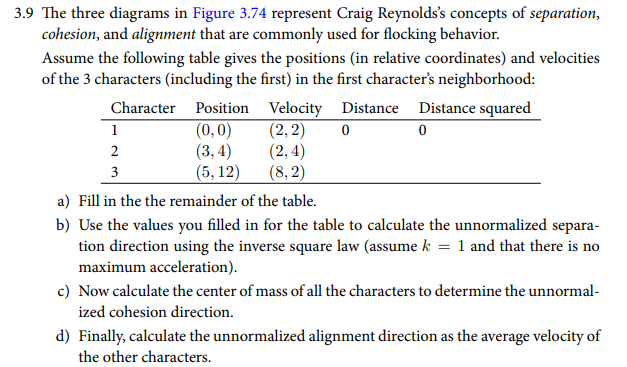

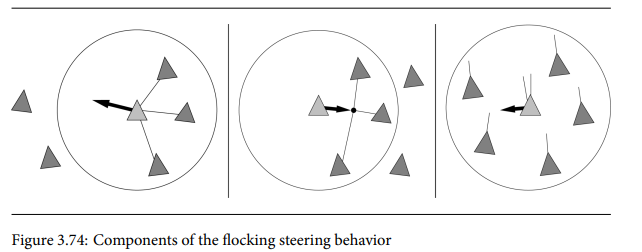

In [2]:
char1_pos = np.array([0, 0], dtype=float)
char1_vel = np.array([2, 2], dtype=float)
char1_dist = 0
char1_distsq = 0

char2_pos = np.array([3, 4], dtype=float)
char2_vel = np.array([2, 4], dtype=float)
char2_dist = np.linalg.norm(char2_pos)
char2_distsq = np.sum(char2_pos ** 2)

char3_pos = np.array([5, 12], dtype=float)
char3_vel = np.array([8, 2], dtype=float)
char3_dist = np.linalg.norm(char3_pos)
char3_distsq = np.sum(char3_pos ** 2)

neighborhood = [[char1_pos, char1_vel, char1_dist, char1_distsq],
                [char2_pos, char2_vel, char2_dist, char2_distsq],
                [char3_pos, char3_vel, char3_dist, char3_distsq]]

for char in neighborhood:
    print(char)

[array([0., 0.]), array([2., 2.]), 0, 0]
[array([3., 4.]), array([2., 4.]), 5.0, 25.0]
[array([ 5., 12.]), array([8., 2.]), 13.0, 169.0]


In [3]:
# Unnormalized separation direction.
k = 1
separation = np.array([0, 0], dtype=float)

for char in neighborhood[1:]: # Ignore the first one. We calculate for him.
    direction = char1_pos - char[0]
    direction /= np.linalg.norm(direction)
    strength = k / char[3] # Inverse square law.
    separation += strength * direction

print(separation)

[-0.02627583 -0.03746199]


In [4]:
# Unnormalized cohesion direction.
cohesion = np.array([0, 0], dtype=float)
center = np.array([0, 0], dtype=float)

for char in neighborhood[1:]: # Ignore the first one. We calculate for him.
    center += char[0]

center /= 2
cohesion = center - char1_pos

print(cohesion)

[4. 8.]


In [5]:
# Unnormalized alignment direction.
alignment = np.array([0, 0], dtype=float)

for char in neighborhood[1:]: # Ignore the first one. We calculate for him.
    alignment += char[1]

print(alignment)

[10.  6.]


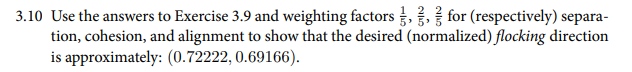

In [6]:
separation *= 1/5
cohesion *= 2/5
alignment *= 2/5

flocking = separation + cohesion + alignment + char1_vel
flocking /= np.linalg.norm(flocking)

print(flocking)

[0.70721094 0.70700261]


#### I think the book author made a mistake? Or I screwed up and didn't understand the assignment.

In [7]:
ex3_10 = leqanimlib.leqanimlib(xlim_min =-20, xlim_max=20, ylim_min=-20, ylim_max=20, title='Flocking', frame_num=360)

char1 = ex3_10.add_object(ex3_10.Dot(np.array([0, 0], dtype=float), color='green'))
char2 = ex3_10.add_object(ex3_10.Dot(np.array([3, 4], dtype=float), color='black'))
char3 = ex3_10.add_object(ex3_10.Dot(np.array([5, 12], dtype=float), color='red'))

char1.vel = np.array([2, 2], dtype=float)
char2.vel = np.array([2, 4], dtype=float)
char3.vel = np.array([8, 2], dtype=float)

char1.movement_mode = leqanimlib.leqanimlib.BaseObject.MovementMode.MOV_FLOCKING
char2.movement_mode = leqanimlib.leqanimlib.BaseObject.MovementMode.MOV_FLOCKING
char3.movement_mode = leqanimlib.leqanimlib.BaseObject.MovementMode.MOV_FLOCKING

flocking_group = leqanimlib.leqanimlib.FlockingGroup([char1, char2, char3], k=1)

char1.flocking_group = flocking_group
char2.flocking_group = flocking_group
char3.flocking_group = flocking_group

def tick_ex3_10(t):
    pass

ex3_10.draw(tick_ex3_10)